
# Home Assignment 2
## Data Science IV, Winter Semester 2020-2021
### Instructor: Johannes Wachs
----
### Instructions 

Please work in pairs of two students: each group just register with me via email by Nov 11th. If you cannot find a partner, please contact me.

Answer the following questions with a mixture of code (Python 3) and markdown cells, as appropriate. Your submission should be a Jupyter notebook (.ipynb). Your notebook should run from beginning to end - please test this before you submit. You may use libraries or code written in class, unless specifically noted otherwise.

Submit your solutions via Learn by ***23.59pm on Friday, November 30th 2020***. Late submissions are accepted for 12 hours following the deadline, with 1/3 of the total possible points deducted from the score.

It is ok to borrow code from online sources and the in-class demonstrations, if you cite all your sources. Plagiarism will result in an automatic score of 0 points.

### Please fill in:
Student 1 name: Kerstin Scharinger

WU Student 1 ID: 11813383

Student 2 name: Felix Schönleitner

WU Student 2 ID: 11705041

----
### Task 1: Importance of Python packages (25 points)
![title](pypi.png)




In this task you will highlight the most important packages in the Python ecosystem. Python has a package manager called PyPi. When you install Python packages (for example: pip install pandas to install Pandas), PyPi does the work for you it.

PyPi insures that insures that you have all the requirements and that there are no conflicts. Using data collected from PyPi (credit: http://kgullikson88.github.io/blog/pypi-analysis.html), please analyze the network of dependencies between packages:

- read in the data in pypi_dependencies.csv. Create directed graph and add the edges: a package should point to its requirements.
- Calculate the in-degrees of all the nodes. Plot the distribution on a log-log scale.
- Calculate the out-degrees of all the nodes. Plot the distribution on a log-log scale.
- Calculate the Pagerank and report the top 25 libraries. Do you recognize any of them?
- Draw the network of dependencies among the top 100 libraries according to Pagerank. Include only non-isolated nodes. For bonus points (3): draw the network hierarchically using the graphviz_layout extension for NetworkX plotting.
- Suppose an evil developer can hack into any package and insert a virus. The virus spreads through dependencies - if A depends on B, and B is infected, then A will be infected too. For each package in the top 200 (according to Pagerank), start a virus there and count how many packages will be infected (if allowed to spread to the full dependency network!). Hint: use NetworkX's ancestor function. Calculate the correlation between the Pagerank score and the virus spreading count of the nodes.


#### read in the data in pypi_dependencies.csv. Create directed graph and add the edges: a package should point to its requirements.

In [1]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import networkx as nx
from networkx.drawing.nx_pydot import graphviz_layout
import matplotlib.pyplot as plt
from matplotlib import patches
import pydot
import random
import seaborn as sns
import numpy as np
sns.set_context('notebook', font_scale=1.5)
sns.set_style('white')

%matplotlib inline

In [3]:
df = pd.read_csv('./pypi_dependencies.csv')
df

,package_name,requirement
0,115wangpan,beautifulsoup4
1,115wangpan,homura
2,115wangpan,humanize
3,115wangpan,pycurl
4,115wangpan,pysocks
...,...,...
73593,zymbit-trequests,requests
73594,zymbit-trequests,tornado
73595,zymbit-trequests,tornalet
73596,zzzeeksphinx,mako


In [4]:
def make_graph(df):
    DG = nx.DiGraph()
    DG.add_nodes_from(df.package_name.unique())
    edges = df.loc[df.requirement.notnull(), ['package_name', 'requirement']].values
    DG.add_edges_from(edges)
    return DG

In [5]:
DG = make_graph(df)

print(len(DG))
print(nx.info(DG))
print(list(DG.edges)[0:10])

26251
Name: 
Type: DiGraph
Number of nodes: 26251
Number of edges: 72469
Average in degree:   2.7606
Average out degree:   2.7606
[('115wangpan', 'beautifulsoup4'), ('115wangpan', 'homura'), ('115wangpan', 'humanize'), ('115wangpan', 'pycurl'), ('115wangpan', 'pysocks'), ('115wangpan', 'requests'), ('115wangpan', 'six'), ('199Fix', 'django'), ('2factorcli', 'docopt'), ('2factorcli', 'onetimepass')]


#### Calculate the in-degrees of all the nodes. Plot the distribution on a log-log scale.

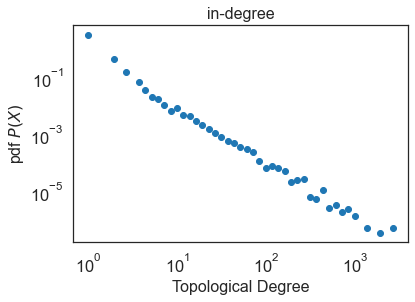

In [6]:
#in-degree: count of links pointing to the node
indegrees=[x[1] for x in DG.in_degree()]

bin_edges = np.logspace(np.log10(1), np.log10(max(indegrees)))
density, _ = np.histogram(indegrees, bins=bin_edges, density=True)
fig02 = plt.figure()
plt.loglog(bin_edges[:-1], density, marker='o', linestyle='none')

plt.xlabel("Topological Degree",size=16)
plt.ylabel(r"pdf $P(X)$",size=16)
plt.title("in-degree", size=16)
plt.show() 

#### Calculate the out-degrees of all the nodes. Plot the distribution on a log-log scale.

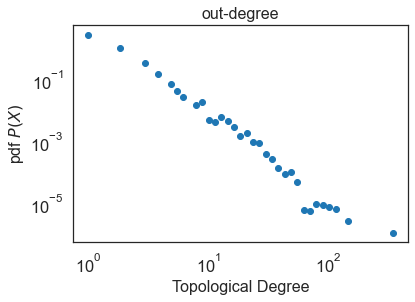

In [7]:
#out-degree: count of links the leaving the node
outdegrees=[x[1] for x in DG.out_degree()]

bin_edges = np.logspace(np.log10(1), np.log10(max(outdegrees)))
density, _ = np.histogram(outdegrees, bins=bin_edges, density=True)
fig02 = plt.figure()
plt.loglog(bin_edges[:-1], density, marker='o', linestyle='none')

plt.xlabel("Topological Degree",size=16)
plt.ylabel(r"pdf $P(X)$",size=16)
plt.title("out-degree", size=16)
plt.show() 

#### Calculate the Pagerank and report the top 25 libraries. Do you recognize any of them?

[('distribute', 0.029638582543667333), ('requests', 0.027806525508763214), ('django', 0.02053400040755323), ('sphinx', 0.015221339948962645), ('six', 0.012830270166172292), ('pyyaml', 0.008043489317628345), ('numpy', 0.006920479797043651), ('pytest', 0.006739681867863385), ('flask', 0.00666468109320654), ('cython', 0.005856939892352387), ('wheel', 0.004927050059182747), ('nose', 0.004803506798250152), ('pytest-cov', 0.004700727164999718), ('twisted', 0.00429433665404223), ('lxml', 0.004286907674420632), ('py', 0.004253729214182827), ('httpbin', 0.0038675355687126257), ('pytest-httpbin', 0.0038613541255081226), ('jinja2', 0.003517849518900935), ('argparse', 0.00347578431814963), ('simplejson', 0.0033374679077926247), ('mock', 0.00321774406713244), ('docopt', 0.0030914676863218102), ('python-dateutil', 0.0029693254958204737), ('click', 0.0029515229985854464)]


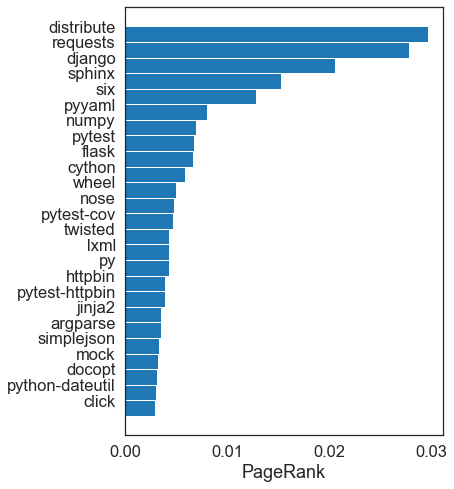

In [8]:
#let's calculate the pagerank
pr=nx.pagerank(DG)
sorted_pr = sorted(pr.items(),key=lambda x: x[1],reverse=True)[0:25]
print(sorted_pr)

#plot the top 25 libraries
N = 25
x = np.arange(N)
y = np.array([d[1] for d in sorted_pr])
xlabels = [d[0] for d in sorted_pr][::-1]
fig, ax = plt.subplots(1, 1, figsize=(7, 7))

ax.barh(x[::-1], y, height=1.0)
ax.set_yticks(x + 0.5)
_ = ax.set_yticklabels(xlabels)
ax.set_xlabel('PageRank')
fig.subplots_adjust(left=0.27, bottom=0.1, top=0.95)

#### The only libraries we really recognize are django and numpy. The other libraries

#### Draw the network of dependencies among the top 100 libraries according to Pagerank. Include only non-isolated nodes. For bonus points (3): draw the network hierarchically using the graphviz_layout extension for NetworkX plotting.

26150
Name: 
Type: DiGraph
Number of nodes: 101
Number of edges: 63
Average in degree:   0.6238
Average out degree:   0.6238


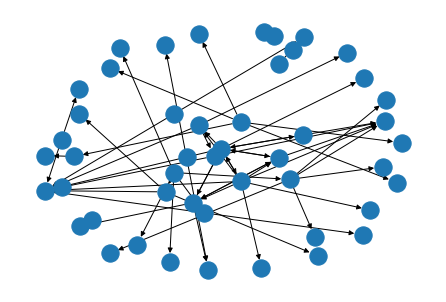

In [9]:
top_pr = list(sorted(pr.items(),key=lambda x: x[1],reverse=True)[101:])
print(len(top_pr))
remove = []

for item in top_pr:
    remove.append(item[0])

DG.remove_nodes_from(remove)
print(nx.info(DG))

outdeg = DG.out_degree()
indeg = DG.in_degree()

remove = []
for nodes in DG.nodes():
    if outdeg(nodes) == 0 and indeg(nodes) == 0:
        remove.append(nodes)

DG.remove_nodes_from(remove)

nx.draw(DG)

In [10]:
pip install pygraphviz

Note: you may need to restart the kernel to use updated packages.


#### Used Roadmap can be found here: https://graphviz.org/
*prog = 'dot' -> “hierarchical” or layered drawings of directed graphs. This is the default tool to use if edges have directionality*

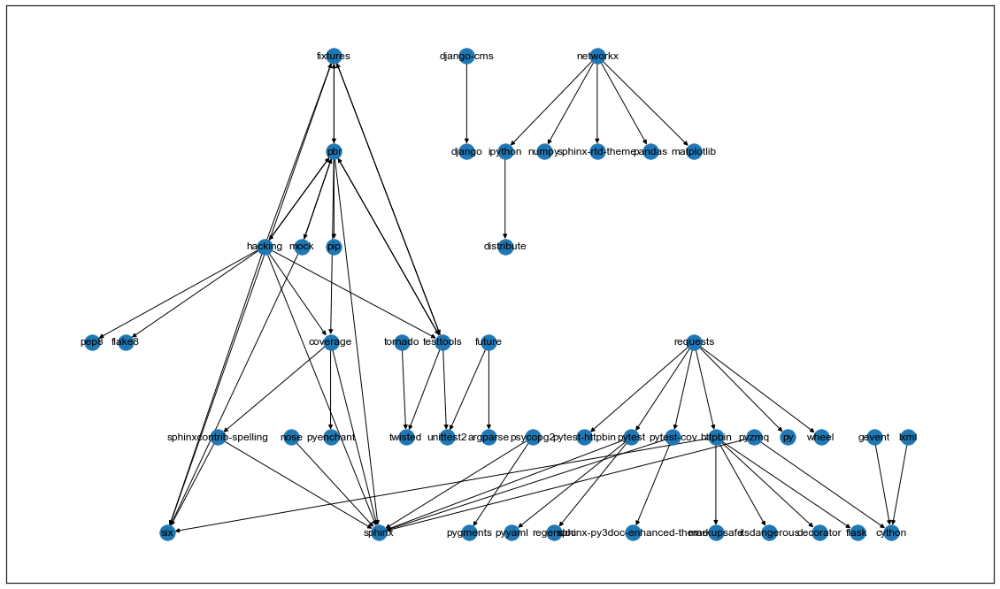

In [11]:
#hierarchically network with graphviz_layout extension for NetworkX plotting dot = 
plt.figure(figsize=(20,12))
pos = nx.nx_pydot.graphviz_layout(DG, prog='dot')
nx.draw_networkx(DG, pos)

#### Suppose an evil developer can hack into any package and insert a virus. The virus spreads through dependencies - if A depends on B, and B is infected, then A will be infected too. For each package in the top 200 (according to Pagerank), start a virus there and count how many packages will be infected (if allowed to spread to the full dependency network!). Hint: use NetworkX's ancestor function. Calculate the correlation between the Pagerank score and the virus spreading count of the nodes.

Name: 
Type: DiGraph
Number of nodes: 200
Number of edges: 160
Average in degree:   0.8000
Average out degree:   0.8000


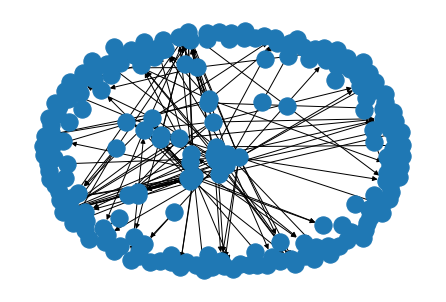

In [12]:
DG = make_graph(df)
pr_list = list(sorted(pr.items(),key=lambda x: x[1],reverse=True)[:200])
keep = []
for l in pr_list:
    keep.append(l[0])

new = DG.subgraph(keep)
print(nx.info(new))
nx.draw(new)

In [13]:
def spread_func(DG, node):
    spread = nx.ancestors(DG, node)
    return node, len(spread)

In [14]:
counts=[spread_func(new,nodes) for nodes in new.nodes()]

count = sorted(counts,key=lambda x: x[0])
spreading = []
[spreading.append(c[1]) for c in count]
pr_list = sorted(pr_list,key=lambda x: x[0])
pagerank = []
[pagerank.append(p[1]) for p in pr_list]

np.corrcoef(spreading,pagerank)

array([[1.        , 0.40400342],
       [0.40400342, 1.        ]])

##### Sources: Python Code Demo of Course 2121 - Application of Data Science, Ph.D. Johannes Wachs

Pyhton NetworkX Documentation: https://networkx.org/documentation/stable/index.html

Analyze the dependencies in pypi metadata: http://kgullikson88.github.io/blog/static/PyPiAnalyzer.html

----
### Task 2: (25 points) - Robustness analysis of the Austrian Power Grid

![title](austrian_power_network.jpg)


(Austrian power grid, from https://www.apg.at/en/Stromnetz/APG-Netz)

In this exercise you will conduct a robustness analysis of the Austrian power grid network.

- read in the network (austrian_power_grid.csv) and plot it, labeling the nodes.
- 50 times, simulate the random removal, one node at a time, of 40 nodes. After each removal, record the share of nodes in the giant connected component of the remaining graph. Hint: make a copy of the graph before each new simulation.
- Plot the results of all 50 simulations: on the x-axis plot the integers 1 to 40. On the y axis plot the share of nodes in the giant connected component of the remaining graph. Each simulation should be plotted in its own line. Color these lines grey with alpha = .3. Then plot the average number of nodes in the giant connected component at each integer on the same graph in red.
- Repeat the simulation and plotting exercise with a targeted removal instead of random removal. Specifically, calculate the degree of each node in the initial graph, and remove them in descending order, starting with the highest degree node first. Do not recalculate the node degrees after each removal. Add the plot of the curve of this simulation to the previous plot, highlighting the targeted attack curve in a different color.
- Reflect on your results: does random failure or targeted failure present a bigger risk to the Austrian power grid? Which stations should be given extra maintenance checks and protection?


#### read in the network (austrian_power_grid.csv) and plot it, labeling the nodes

In [15]:
pg = pd.read_csv('./austrian_power_grid.csv')

In [16]:
def make_graph(df):
    DG = nx.Graph()
    DG.add_nodes_from(df.A.unique())
    edges = df.loc[df.B.notnull(), ['A', 'B']].values
    DG.add_edges_from(edges)
    return DG

In [17]:
PG = make_graph(pg)

Name: 
Type: Graph
Number of nodes: 69
Number of edges: 87
Average degree:   2.5217


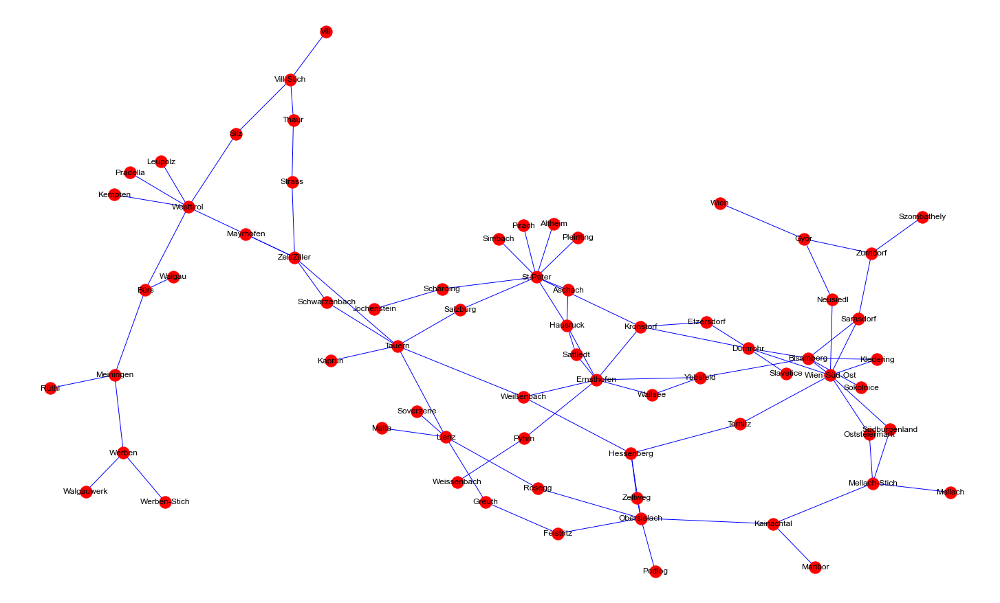

In [18]:
print(nx.info(PG))
plt.figure(figsize=(20,12))
nx.draw(PG, with_labels=True,edge_color='blue',node_shape='o',node_color='red')

#### 50 times, simulate the random removal, one node at a time, of 40 nodes. After each removal, record the share of nodes in the giant connected component of the remaining graph. Hint: make a copy of the graph before each new simulation.

In [19]:
def random_removal(G):
    nodes = [i for i in G.nodes()]
    x = random.randint(0,len(nodes)-1)
    G.remove_node(nodes[x])
    return G

In [20]:
connectivity =np.zeros(40)
for _ in range(50):
    rep = 40 #num of iterations/nodes to remove
    share_rand = []
    H = PG.copy()
    N = len(H)

    for i in range(rep):
        gc = nx.subgraph(H,max(nx.connected_components(H), key = len))
        share_rand.append(len(gc)/N)
        H = random_removal(H)
        N -= 1
    connectivity+=np.array(share_rand)
print(connectivity)

[50.         49.33823529 48.17910448 47.34848485 46.66153846 46.015625
 44.80952381 43.56451613 42.81967213 42.18333333 40.81355932 40.22413793
 39.24561404 37.69642857 37.32727273 35.72222222 34.88679245 33.38461538
 31.94117647 30.9        29.87755102 28.8125     27.80851064 26.97826087
 26.22222222 25.29545455 24.72093023 23.5952381  22.3902439  21.725
 20.87179487 20.23684211 19.48648649 18.11111111 17.48571429 17.32352941
 16.90909091 16.40625    16.25806452 16.43333333]


#### Plot the results of all 50 simulations: on the x-axis plot the integers 1 to 40. On the y axis plot the share of nodes in the giant connected component of the remaining graph. Each simulation should be plotted in its own line. Color these lines grey with alpha = .3. Then plot the average number of nodes in the giant connected component at each integer on the same graph in red.

In [21]:
def simulate_removal(PG, rep):
    share_rand = []
    H = PG.copy()
    N = len(H)

    for i in range(rep):
        gc = nx.subgraph(H,max(nx.connected_components(H), key = len))
        share_rand.append(len(gc)/N)
        H = random_removal(H)
        N -= 1
    return share_rand

(-0.1, 1.0)

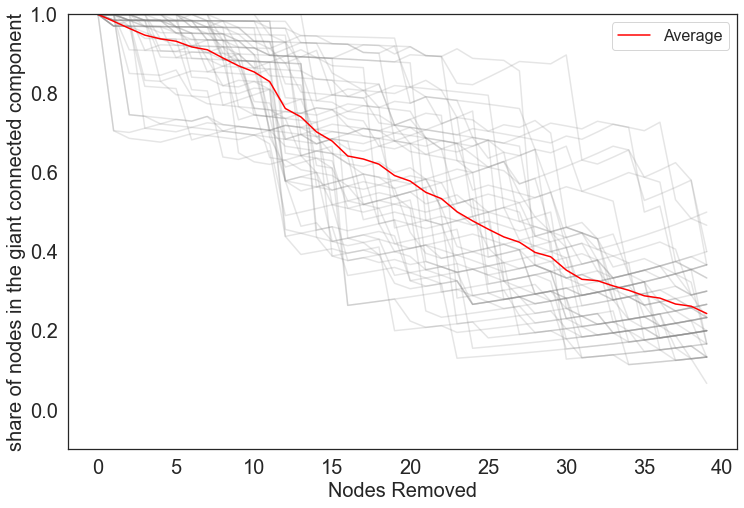

In [22]:
plt.figure(figsize=(12,8))

outcomes=np.zeros(40)
for _ in range(50):
    simulation = simulate_removal(PG,40)
    plt.plot(simulation,alpha=.2,color='grey')
    outcomes+=np.array(simulation)
plt.plot(outcomes/50,label='Average',color='red')
plt.legend(prop={'size': 16})
plt.ylabel('share of nodes in the giant connected component',size=20)
plt.xlabel('Nodes Removed',size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.ylim([-.1,1])

#### Repeat the simulation and plotting exercise with a targeted removal instead of random removal. Specifically, calculate the degree of each node in the initial graph, and remove them in descending order, starting with the highest degree node first. Do not recalculate the node degrees after each removal. Add the plot of the curve of this simulation to the previous plot, highlighting the targeted attack curve in a different color.

In [23]:
def target_removal(G):
    deg_seq = sorted([(n,d) for n,d in G.degree()],reverse = True, key = lambda x : x[1])
    seq = [n for n, d in deg_seq]
    G.remove_node(seq[0])
    return G

In [24]:
#Share of nodes in the giant component after removing highest degree nodes
def simulate_target_removal(PG, rep):
    share_t = []
    D = PG.copy()
    N = len(D)

    for i in range(rep):
        gc = nx.subgraph(D,max(nx.connected_components(D), key = len))
        share_t.append(len(gc)/N)
        D = target_removal(D)
        N -= 1
    return share_t

(-0.1, 1.0)

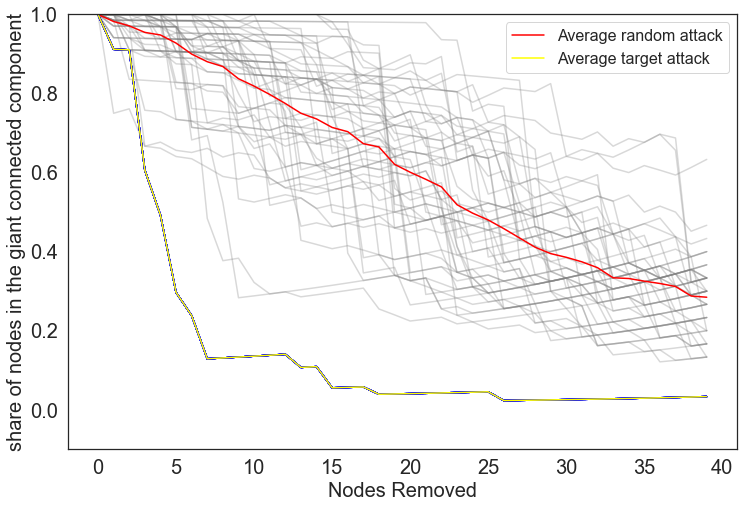

In [25]:
plt.figure(figsize=(12,8))
#random_removal
outcomes=np.zeros(40)
for _ in range(50):
    simulation = simulate_removal(PG,40)
    plt.plot(simulation,alpha=.3,color='grey')
    outcomes+=np.array(simulation)
plt.plot(outcomes/50,label='Average random attack',color='red')

#target_removal
output=np.zeros(40)
for _ in range(50):
    sim = simulate_target_removal(PG,40)
    plt.plot(sim,alpha=.3,color='blue')
    output+=np.array(sim)
plt.plot(output/50,label='Average target attack',color='yellow')
plt.legend(prop={'size': 16})
plt.ylabel('share of nodes in the giant connected component',size=20)
plt.xlabel('Nodes Removed',size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.ylim([-.1,1])

#### Reflect on your results: does random failure or targeted failure present a bigger risk to the Austrian power grid? Which stations should be given extra maintenance checks and protection?

#### The targeted failure present a bigger risk to the Austrian power grid according to the outcome of our analysis. 

In [26]:
print('This top 10 stations should be given extra maintenance checks and protection: ')
sorted([(n,d) for n,d in PG.degree()],reverse = True, key = lambda x : x[1])[:10]

This top 10 stations should be given extra maintenance checks and protection: 


[('St.Peter', 9),
 ('Wien-Süd-Ost', 8),
 ('Ernsthofen', 7),
 ('Bisamberg', 6),
 ('Obersielach', 6),
 ('Tauern', 6),
 ('Westtirol', 6),
 ('Dürnrohr', 5),
 ('Lienz', 5),
 ('Zell/Ziller', 5)]

##### Sources: Python Code Demo of Course 2121 - Application of Data Science, Ph.D. Johannes Wachs
Pyhton NetworkX Documentation: https://networkx.org/documentation/stable/index.html

----
### Task 3: Spreading illness on a social network (50 points)

In this exercise you will analyze the spread of an illness on a social network of a small town and the effect of reducing contacts.

- Read in the social network's edgelist (social_network.csv). The undirected edges denote friendship and contact.
- Plot the network
- Write a function to simulate an epidemic:

---- On day 1 a random node is infected.

---- Every day, each infected node spreads the infection to each neighbor with probability 0.1.

---- The simulation ends after 50 days. Nodes that become infected, stay infected.

---- The function should return a vector of the share of nodes infected each day.

- Simulate 50 epidemics. Plot the spreading curves: on the x-axis plot the days, and on the y axis plot the share of nodes infected. Each simulated epidemic should be its own curve.

- Plot in red the average share of infected nodes on each day across the 50 simulations.

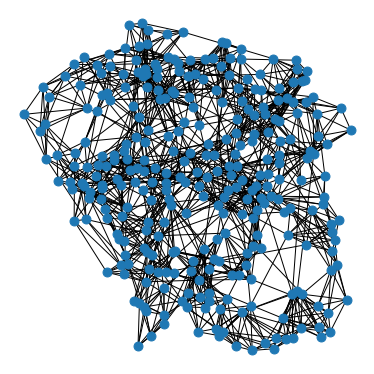

In [27]:
# In order to skip the first line - We decided to mark the first line as a comment - there is for sure a more beautiful way to do it
G = nx.read_edgelist("social_network.csv", delimiter=",", comments='A') 
pos = nx.spring_layout(G)
plt.figure(figsize=(5,5))
nx.draw(G,pos=pos,node_size=80)
plt.show()

In [28]:
def spread_epedemic(network,days,beta,plot=True):
    
    intialization={node:'S' for node in network.nodes()} 
    nx.set_node_attributes(network,intialization,'state')
    patient_zero=random.choice(list(network.nodes())) 
    network.nodes[patient_zero]['state']='I' 
    pos = nx.spring_layout(network)
    nx.set_node_attributes(network,pos,'positions')
    infection_per_day = []
    
    for _ in range(days):
        
        if plot:
            plt.figure(figsize=(5,5))
            color_map = {}
            for node in network.nodes():
                if network.nodes[node]['state'] =='S':
                    color_map[node]='green'
                else:
                    color_map[node]='red'
            nx.draw(network,pos=nx.get_node_attributes(network,'positions'),node_color = list(color_map.values()),node_size=100)
            plt.show()
        
        n_nodes = network.number_of_nodes()
        pct_infected = []

        node_states = nx.get_node_attributes(network,'state')
        count_infected = 0
        for node in node_states:
            if node_states[node]=='I':
                count_infected+=1
        pct_infected.append(count_infected/n_nodes)

        infection_per_day.append(pct_infected[-1])
        

        node_states=nx.get_node_attributes(network,'state') 
        for node in network.nodes(): 
            if node_states[node]=='S': 
                for neighbor in network.neighbors(node): 
                    if node_states[neighbor]=='I': 
                        if random.random() < beta: 
                            network.nodes[node]['state']='I'
                        
    return infection_per_day

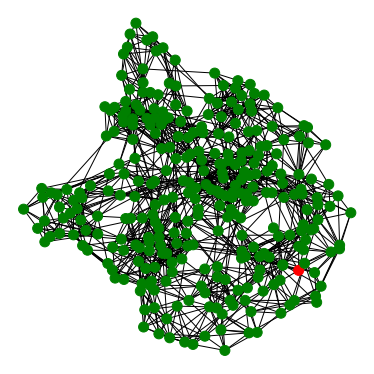

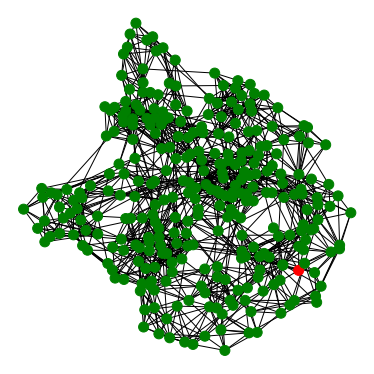

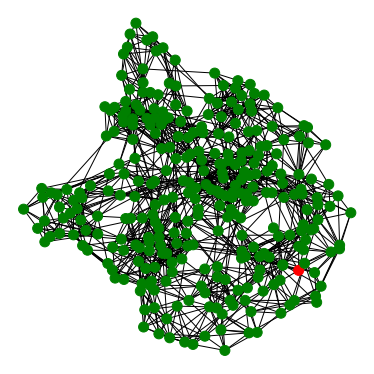

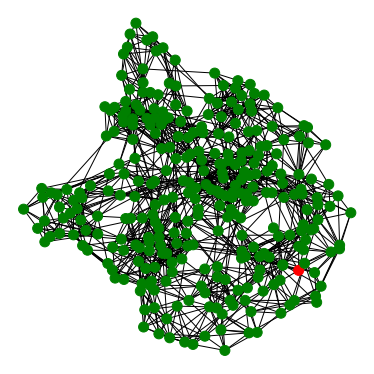

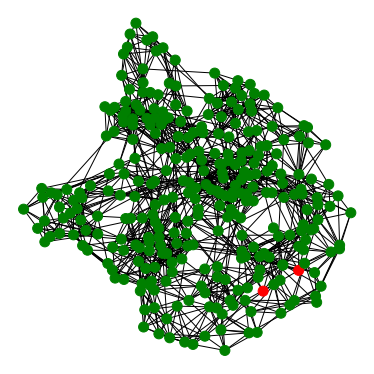

...

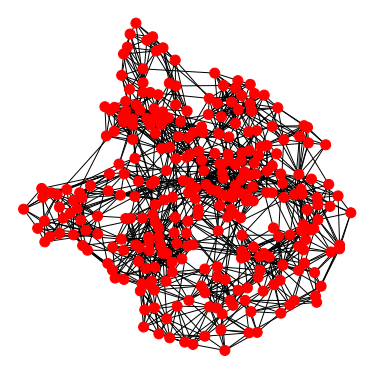

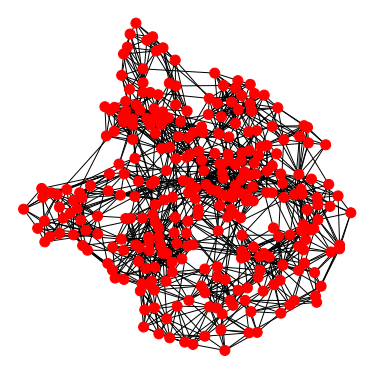

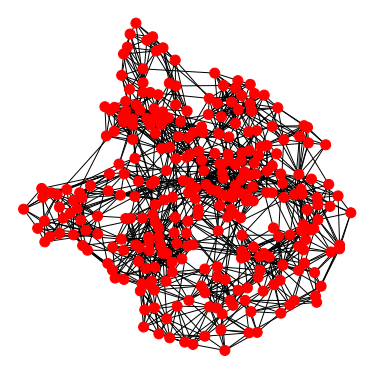

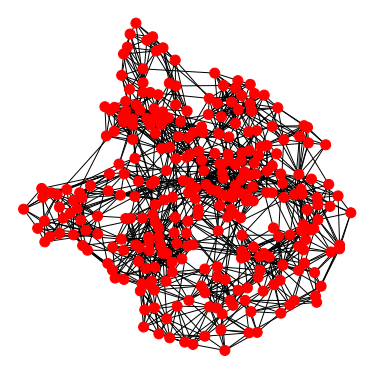

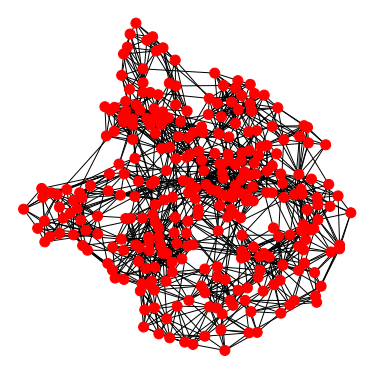

[0.0033333333333333335,
 0.0033333333333333335,
 0.0033333333333333335,
 0.0033333333333333335,
 0.006666666666666667,
 0.006666666666666667,
 0.01,
 0.02,
 0.023333333333333334,
 0.03666666666666667,
 0.043333333333333335,
 0.056666666666666664,
 0.08,
 0.1,
 0.12666666666666668,
 0.17,
 0.21666666666666667,
 0.3,
 0.36333333333333334,
 0.43333333333333335,
 0.56,
 0.6933333333333334,
 0.79,
 0.8766666666666667,
 0.9366666666666666,
 0.9766666666666667,
 0.99,
 0.9933333333333333,
 0.9966666666666667,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0]

In [29]:
# Simulates once 50 days of spreading - returns percent of infected population
spread_epedemic(G,50,0.1, plot=True)

(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

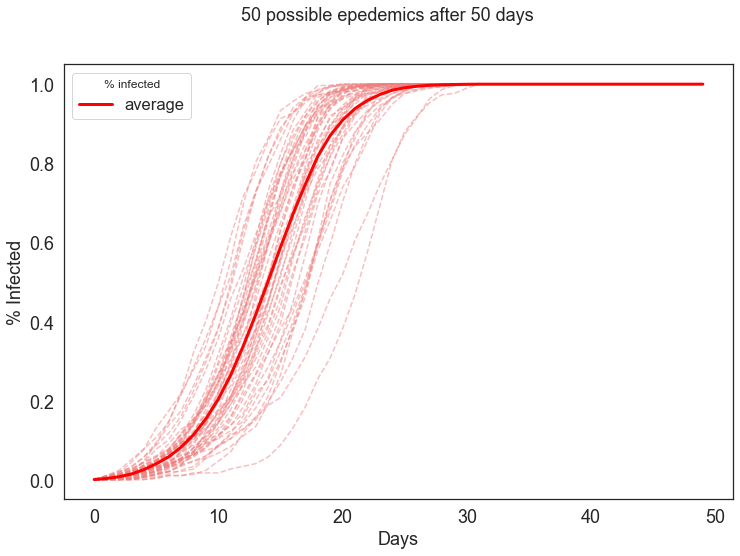

In [30]:
plt.figure(figsize=(12,8))
all_epedemics = []
for _ in range(50):
    epedemics = spread_epedemic(G,50,0.1,plot=False)
    plt.plot(epedemics, linestyle='--',color ='lightcoral',alpha=0.5)
    all_epedemics.append(epedemics)
arrays = [np.array(x) for x in all_epedemics]
plt.plot([np.mean(k) for k in zip(*arrays)], color='red',linewidth=3, label='average')
plt.legend(title='% infected')
plt.suptitle('50 possible epedemics after 50 days', fontsize=18)
plt.ylabel('% Infected',size=18)
plt.xlabel('Days',size=18)
plt.xticks(size=18)
plt.yticks(size=18)

### Part 2: 
- Revisit the analysis with social distancing: each node is allowed at most K connections. 

---- Write a function to edit the social network called social_distancing. The function should make a copy of your graph. For each node with more than K connections, randomly remove edges until they have at most K connections. Be careful to recalculate the node degrees after each node has its excess connections cut.

---- For each of K = 3,5,7, create a socially-distanced copy of the social network. Run the epidemic 50 times on each social network, recording the share of nodes infected every day.

---- Plot the average share of infected nodes on each day across the 50 simulations for each value of K.

---- Reflect: As a policymaker- what restriction would you impose on social contacts?

In [31]:
def social_distancing(G,K):
    H = G.copy()
    for node in H.nodes():
        node_d = H.degree(node)
        while node_d > K:
            if H.degree(node) > K:
                random_node = random.choice([n for n in G.neighbors(node)])
            if H.has_edge(node,random_node):
                H.remove_edge(node,random_node)
            node_d = H.degree(node)
    return H

In [43]:
G_7 = social_distancing(G,7)
G_5 = social_distancing(G,5)
G_3 = social_distancing(G,3)

### Interesting here is that we do not lose any nodes

In [44]:
G.number_of_nodes() == G_7.number_of_nodes() == G_5.number_of_nodes() == G_3.number_of_nodes()

True

# K = 7

(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

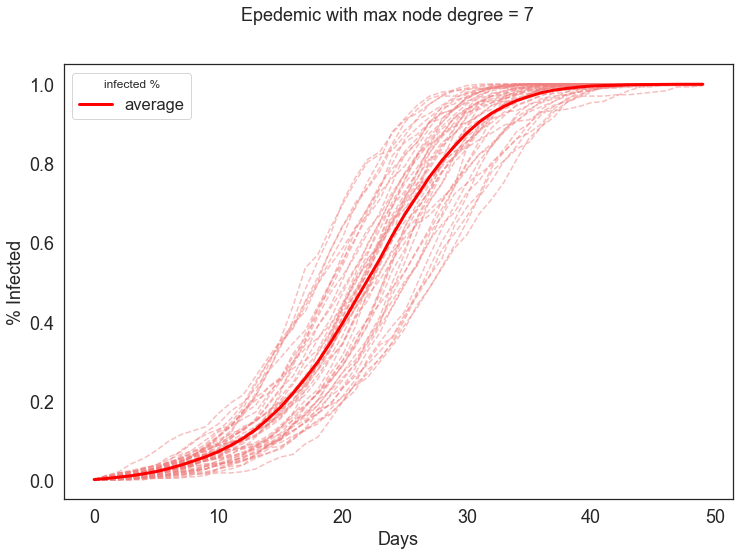

In [34]:
plt.figure(figsize=(12,8))
all_epedemics = []
for _ in range(50):
    epedemics = spread_epedemic(G_7,50,0.1,plot=False)
    plt.plot(epedemics, linestyle='--',color ='lightcoral',alpha=0.5)
    all_epedemics.append(epedemics)
arrays = [np.array(x) for x in all_epedemics]
plt.plot([np.mean(k) for k in zip(*arrays)], color='red',linewidth=3, label='average')
plt.legend(title='infected %')
plt.suptitle('Epedemic with max node degree = 7', fontsize=18)
plt.ylabel('% Infected',size=18)
plt.xlabel('Days',size=18)
plt.xticks(size=18)
plt.yticks(size=18)

# K = 5

(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

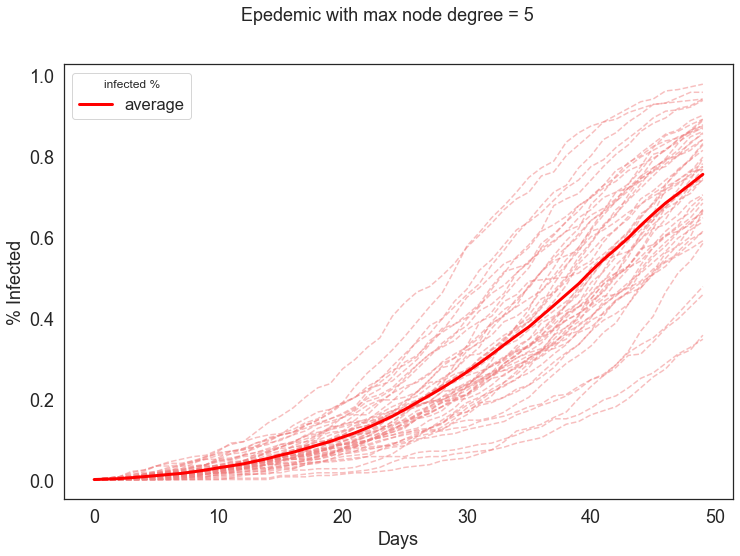

In [35]:
plt.figure(figsize=(12,8))
all_epedemics = []
for _ in range(50):
    epedemics = spread_epedemic(G_5,50,0.1,plot=False)
    plt.plot(epedemics, linestyle='--',color ='lightcoral',alpha=0.5)
    all_epedemics.append(epedemics)
arrays = [np.array(x) for x in all_epedemics]
plt.plot([np.mean(k) for k in zip(*arrays)], color='red',linewidth=3, label='average')
plt.legend(title='infected %')
plt.suptitle('Epedemic with max node degree = 5', fontsize=18)
plt.ylabel('% Infected',size=18)
plt.xlabel('Days',size=18)
plt.xticks(size=18)
plt.yticks(size=18)

# K = 3

(array([-0.02,  0.  ,  0.02,  0.04,  0.06,  0.08,  0.1 ,  0.12,  0.14]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

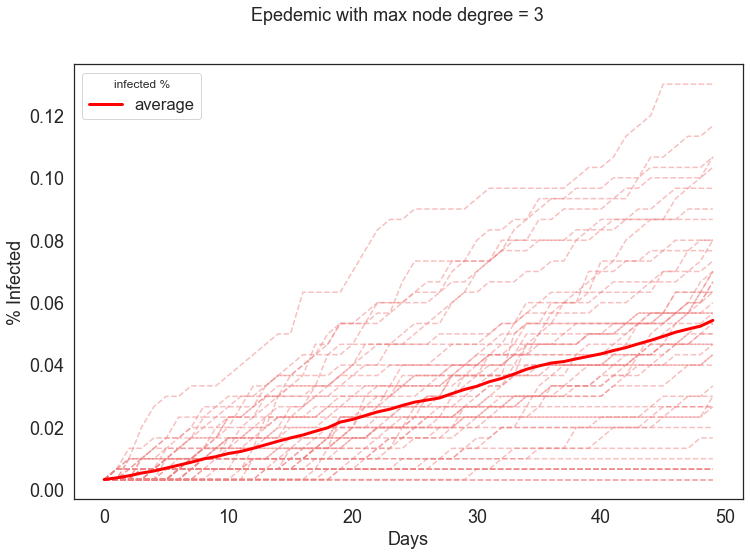

In [36]:
plt.figure(figsize=(12,8))
all_epedemics = []
for _ in range(50):
    epedemics = spread_epedemic(G_3,50,0.1,plot=False)
    plt.plot(epedemics, linestyle='--',color ='lightcoral',alpha=0.5)
    all_epedemics.append(epedemics)
arrays = [np.array(x) for x in all_epedemics]
plt.plot([np.mean(k) for k in zip(*arrays)], color='red',linewidth=3, label='average')
plt.legend(title='infected %')
plt.suptitle('Epedemic with max node degree = 3', fontsize=18)
plt.ylabel('% Infected',size=18)
plt.xlabel('Days',size=18)
plt.xticks(size=18)
plt.yticks(size=18)

### Conclusion 

#### It makes of course sense to limit the number of person one is in contact during a pandemic. We can clearly see that the lower K is - the longer it takes until the virus infects more people. Where K = 3 it is even possible that the virus will die.

### Part 3: 
- Revisit the analysis with a vaccine. Suppose we develop a vaccine, but can only make 50 of them.

---- Write an updated function to simulate an epidemic spread which takes as an input a list of nodes which are vaccinated and immune to the virus. The nodes with the vaccine cannot be infected and cannot spread the virus.

---- On the original network, simulate 50 epidemics. Each time, pick 50 random nodes to vaccinate. Plot the average share of nodes infected every day. Be sure that the first person to have the illness is not vaccinated.

---- Repeat the experiment (simulating 50 epidemics), giving the vaccine to the 50 nodes with highest degree. Plot the average share of nodes infected every day.

---- Plot all three curves on the same plot. Describe what is happening. Does the targeted vaccine strategy make a significant difference in the outcomes?


In [37]:
def random_vac_nodes(network):
    nodes = network.nodes()
    sample = list(random.sample(nodes,50))
    return sample
    
def spread_epedemic_w_vac (network,days,beta,vac_nodes,plot=True):
    
    intialization={node:'S' for node in network.nodes()} 
    nx.set_node_attributes(network,intialization,'state')
    
    for node in vac_nodes:
        network.nodes[node]['state'] ='V'
    not_vac_nodes = network.nodes() - vac_nodes
    patient_zero=random.choice(list(not_vac_nodes)) 
    network.nodes[patient_zero]['state']='I' 
    pos = nx.spring_layout(network)
    nx.set_node_attributes(network,pos,'positions')
    infection_per_day = []
    
    for _ in range(days):
        
        if plot:
            plt.figure(figsize=(5,5))
            color_map = {}
            for node in network.nodes():
                if network.nodes[node]['state'] =='S':
                    color_map[node]='green'
                elif network.nodes[node]['state'] =='V':
                    color_map[node]='blue'
                else:
                    color_map[node]='red'
            nx.draw(network,pos=nx.get_node_attributes(network,'positions'),node_color = list(color_map.values()),node_size=100)
            plt.show()
        
        n_nodes = network.number_of_nodes()
        pct_infected = []

        node_states = nx.get_node_attributes(network,'state')
        count_infected = 0
        for node in node_states:
            if node_states[node]=='I':
                count_infected+=1
        pct_infected.append(count_infected/n_nodes)
        
        infection_per_day.append(pct_infected[-1])
        

        node_states=nx.get_node_attributes(network,'state') 
        for node in network.nodes(): 
            if node_states[node]=='S': 
                for neighbor in network.neighbors(node): 
                    if node_states[neighbor]=='I': 
                        if random.random() < beta: 
                            network.nodes[node]['state']='I'  
                        
    return infection_per_day

(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

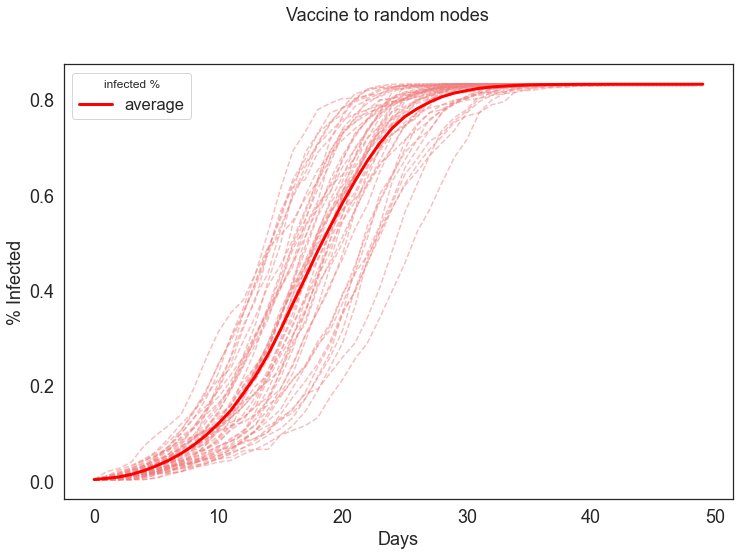

In [42]:
plt.figure(figsize=(12,8))
all_epedemics = []
for _ in range(50):
    epedemics = spread_epedemic_w_vac(G,50,0.1,random_vac_nodes(G),plot=False)
    plt.plot(epedemics, linestyle='--',color ='lightcoral',alpha=0.5)
    all_epedemics.append(epedemics)
arrays = [np.array(x) for x in all_epedemics]
plt.plot([np.mean(k) for k in zip(*arrays)], color='red',linewidth=3, label='average')
plt.legend(title='infected %')
plt.suptitle('Vaccine to random nodes', fontsize=18)
plt.ylabel('% Infected',size=18)
plt.xlabel('Days',size=18)
plt.xticks(size=18)
plt.yticks(size=18)

### Now we are going to select all nodes with the highest degree

In [39]:
# take top 50 nodes
sorted_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:50]


# create list with the nodes with the highest degree
nodes_d = []
for _ in range(len(sorted_nodes)):
    nodes_d.append(sorted_nodes[_][0])

# quick check if there are 50
len(sorted_nodes) == 50

True

### Simulate how it will look if we give the vaccine to the nodes with the highest degree

(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

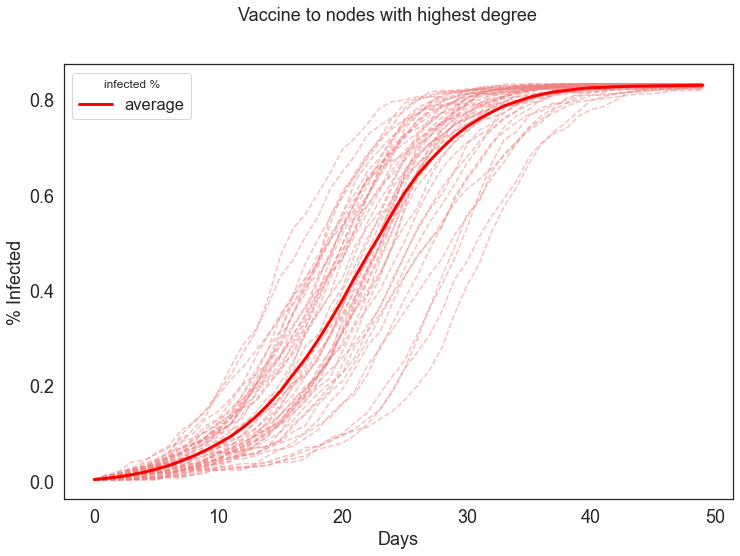

In [40]:
plt.figure(figsize=(12,8))
all_epedemics = []
for _ in range(50):
    epedemics = spread_epedemic_w_vac(G,50,0.1,nodes_d,plot=False)
    plt.plot(epedemics, linestyle='--', color ='lightcoral',alpha=0.5)
    all_epedemics.append(epedemics)
arrays = [np.array(x) for x in all_epedemics]
plt.plot([np.mean(k) for k in zip(*arrays)], color='red',linewidth=3, label='average')
plt.legend(title='infected %')
plt.suptitle('Vaccine to nodes with highest degree', fontsize=18)
plt.ylabel('% Infected',size=18)
plt.xlabel('Days',size=18)
plt.xticks(size=18)
plt.yticks(size=18)

### Plot all three different strategies in one graph

(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

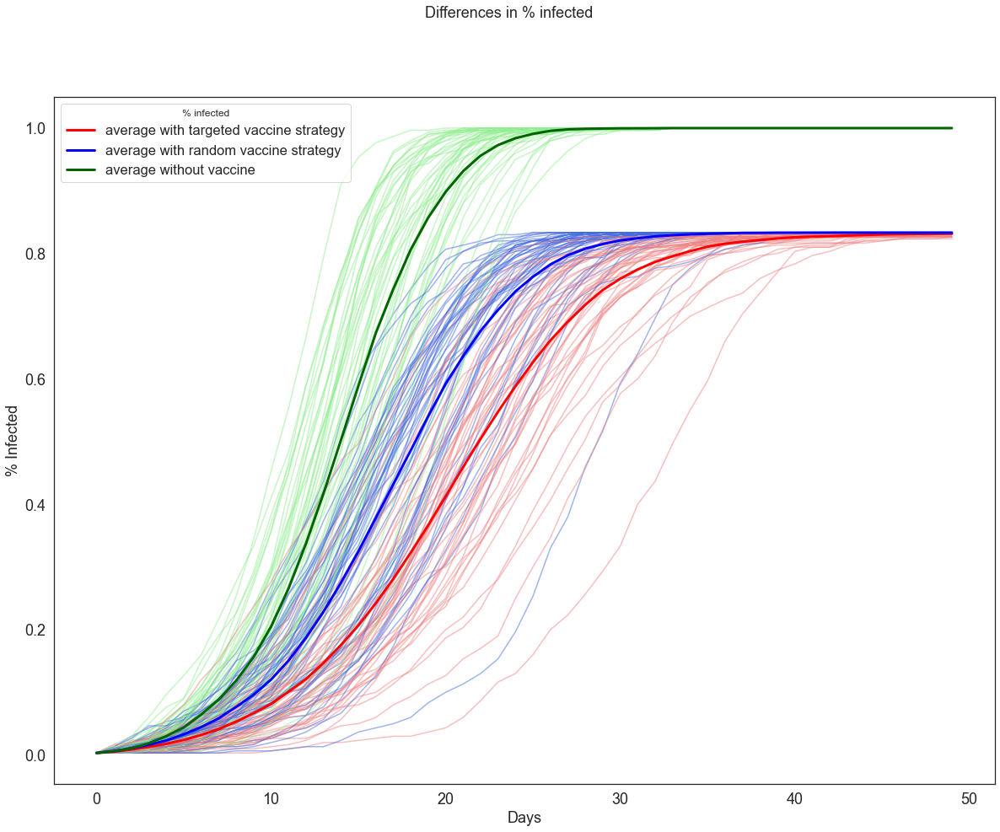

In [41]:
plt.figure(figsize=(20,15))
all_epedemics = []
all_epedemics_2 = []
all_epedemics_3 = []
for _ in range(50):
    epedemics = spread_epedemic_w_vac(G,50,0.1,nodes_d,plot=False)
    plt.plot(epedemics, linestyle='-', color ='lightcoral',alpha=0.5)
    epedemics_2 = spread_epedemic_w_vac(G,50,0.1,random_vac_nodes(G),plot=False)
    plt.plot(epedemics_2, linestyle='-', color ='royalblue',alpha=0.5)
    epedemics_3 = spread_epedemic(G,50,0.1,plot=False)
    plt.plot(epedemics_3, linestyle='-', color ='lightgreen',alpha=0.5)
    all_epedemics.append(epedemics)
    all_epedemics_2.append(epedemics_2) 
    all_epedemics_3.append(epedemics_3)
arrays = [np.array(x) for x in all_epedemics]
arrays_2 = [np.array(x) for x in all_epedemics_2]
arrays_3 = [np.array(x) for x in all_epedemics_3]
plt.plot([np.mean(k) for k in zip(*arrays)], color='red',linewidth=3, label='average with targeted vaccine strategy')
plt.plot([np.mean(k) for k in zip(*arrays_2)], color='blue',linewidth=3, label='average with random vaccine strategy')
plt.plot([np.mean(k) for k in zip(*arrays_3)], color='darkgreen',linewidth=3, label='average without vaccine')
plt.suptitle('Differences in % infected', fontsize=18)
plt.legend(title='% infected', loc='upper left')
plt.ylabel('% Infected',size=18)
plt.xlabel('Days',size=18)
plt.xticks(size=18)
plt.yticks(size=18)

### Conclusion

#### When we plot all three graphs - no vaccine at all, random distribution of vaccine and give the vaccine to the nodes with the highest degrre - we can clearly see that it takes longer until more nodes get infected if we have a vaccine. But it is also important to give the vaccine the nodes with the highest degree. If we have a look on the averages of this three pandemics, you can clearly see that it decreases significantly with vaccine and even more with the vaccine to the nodes with the highest degree.

##### Sources: Python Code Demo of Course 2121 - Application of Data Science, Ph.D. Johannes Wachs
Pyhton NetworkX Documentation: https://networkx.org/documentation/stable/index.html